<a href="https://colab.research.google.com/github/Sandeep2017/Diabetic-Retinopathy-detection/blob/master/DR_CLAHE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import files

In [0]:
files.upload()

In [0]:
!ls -lha kaggle.json
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

!chmod 600 ~/.kaggle/kaggle.json

-rw-r--r-- 1 root root 67 Apr 16 09:50 kaggle.json


In [0]:
!kaggle datasets download -d dola1507108/diabetic-retinopathy-classified/diabetic-retinopathy-customized/resized_train_cropped/resized_train_cropped/

100% 7.23G/7.26G [01:49<00:00, 50.3MB/s]
100% 7.26G/7.26G [01:49<00:00, 71.0MB/s]


In [0]:

!unzip \/content/diabetic-retinopathy-classified.zip

In [0]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage.io
from skimage.transform import resize
from imgaug import augmenters as iaa
from tqdm import tqdm
import PIL
from PIL import Image, ImageOps
import cv2
from sklearn.utils import class_weight, shuffle
from keras.losses import binary_crossentropy
from keras.applications.resnet50 import preprocess_input
import keras.backend as K
import tensorflow as tf
from sklearn.metrics import f1_score, fbeta_score
from keras.utils import Sequence
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

WORKERS = 2
CHANNEL = 3

import warnings
warnings.filterwarnings("ignore")
IMG_SIZE = 512
NUM_CLASSES = 5
SEED = 77
TRAIN_NUM = 1000 # use 1000 when you just want to explore new idea, use -1 for full train

Using TensorFlow backend.


In [0]:
df_train = pd.read_csv('/content/diabetic-retinopathy-customized/trainLabels_cropped.csv')
df_train1 = pd.read_csv('/content/diabetic-retinopathy-customized/trainLabels.csv')

In [0]:
df_train1.head(60)

In [0]:
x = df_train1['image'] # image names 
y = df_train1['level'] # label

x, y = shuffle(x, y, random_state=SEED)

(29857,) (29857,) (5269,) (5269,)


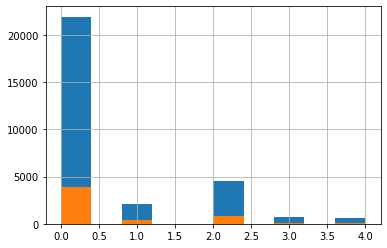

In [0]:
train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15,
                                                      stratify=y, random_state=SEED)
print(train_x.shape, train_y.shape, valid_x.shape, valid_y.shape)
train_y.hist()
valid_y.hist()

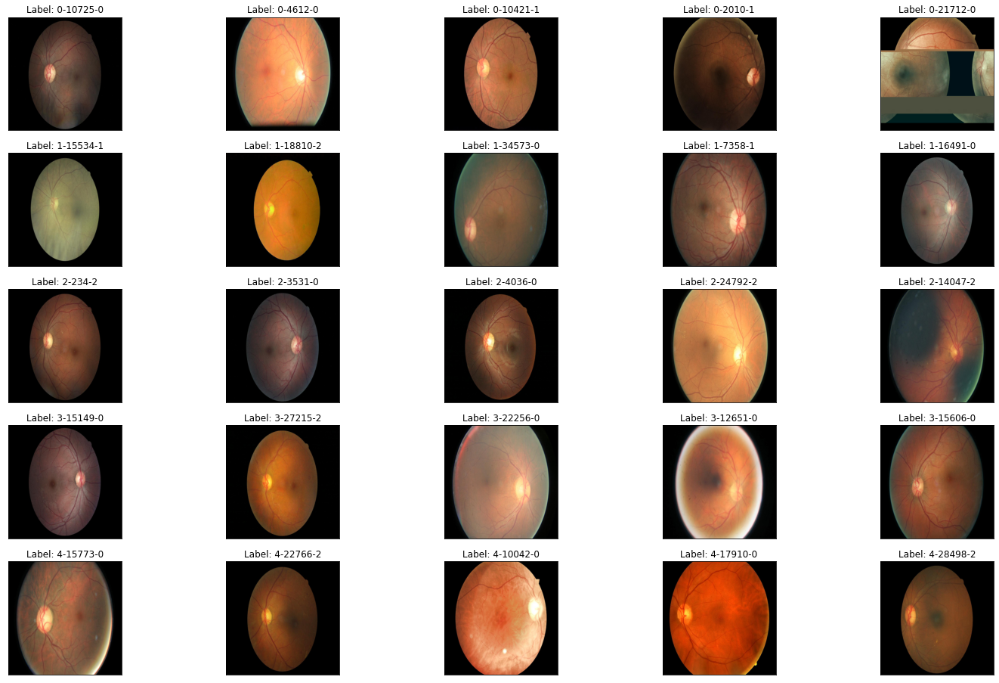

In [0]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train1['level'] == class_id].sample(5, random_state=0).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/{row['image']}.jpeg"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image)
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['level']) )

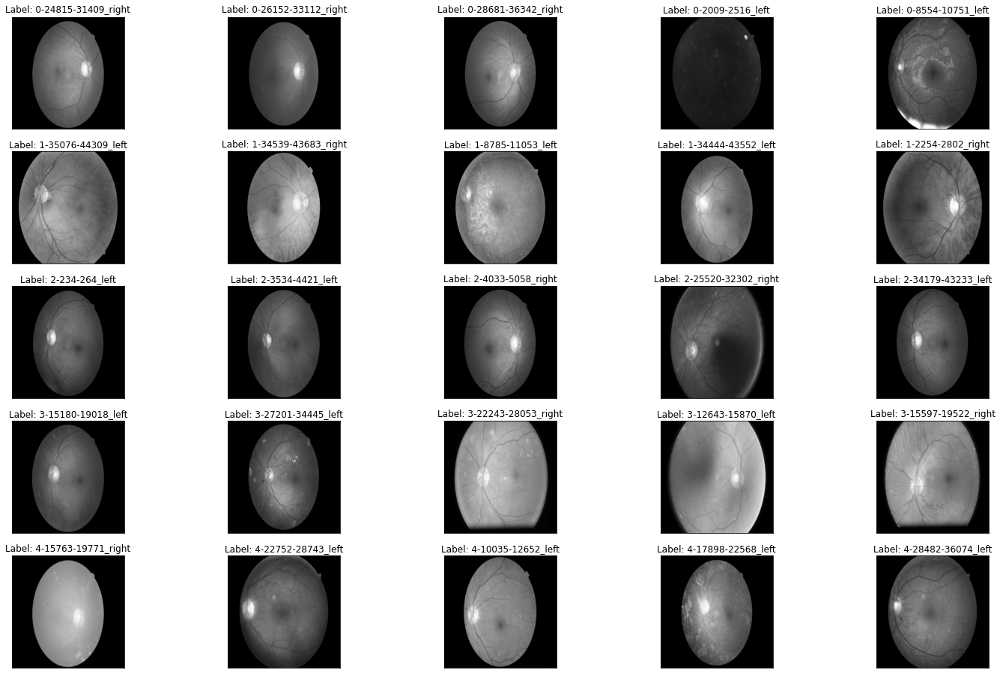

In [0]:
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['level'] == class_id].sample(5, random_state=0).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/{row['image']}.jpeg"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#         image=cv2.addWeighted ( image, 0 , cv2.GaussianBlur( image , (0 ,0 ) , 10) ,-4 ,128)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['image']) )

683 1024


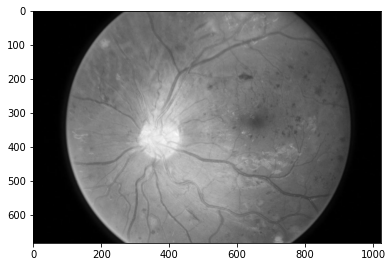

In [0]:
dpi = 80 #inch

# path=f"../input/aptos2019-blindness-detection/train_images/5c7ab966a3ee.png" # notice upper part
path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/16_right.jpeg" # lower-right, this still looks not so severe, can be class3
image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
height, width = image.shape
print(height, width)

SCALE=2
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')

683 1024


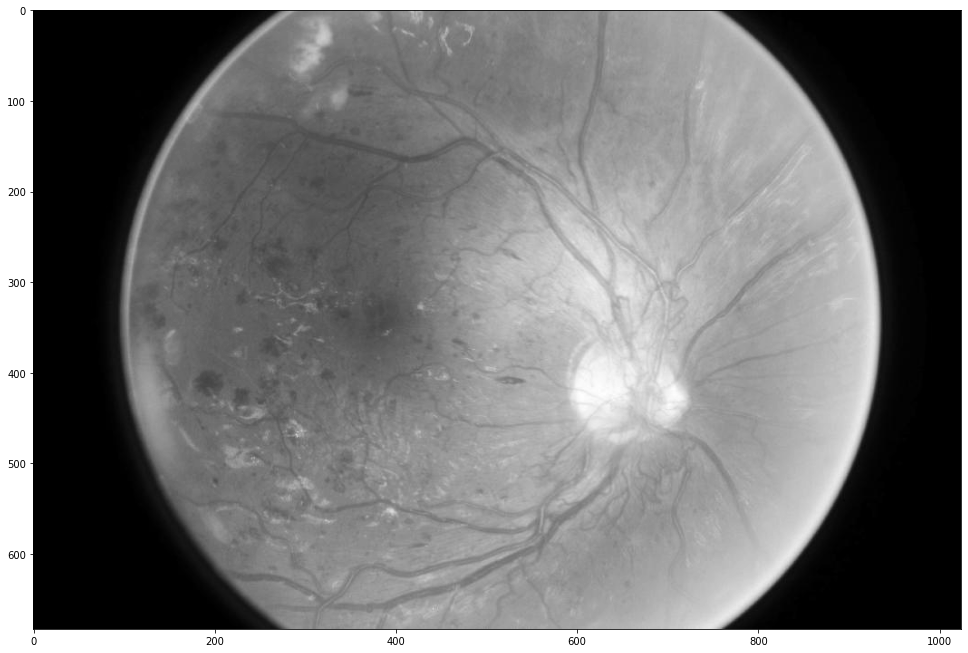

In [0]:
dpi = 10 #inch

path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/16_left.jpeg" # notice upper part
# path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/16_right.jpeg" # lower-right, this still looks not so severe, can be class3
image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
height, width = image.shape
print(height, width)

SCALE=6
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')

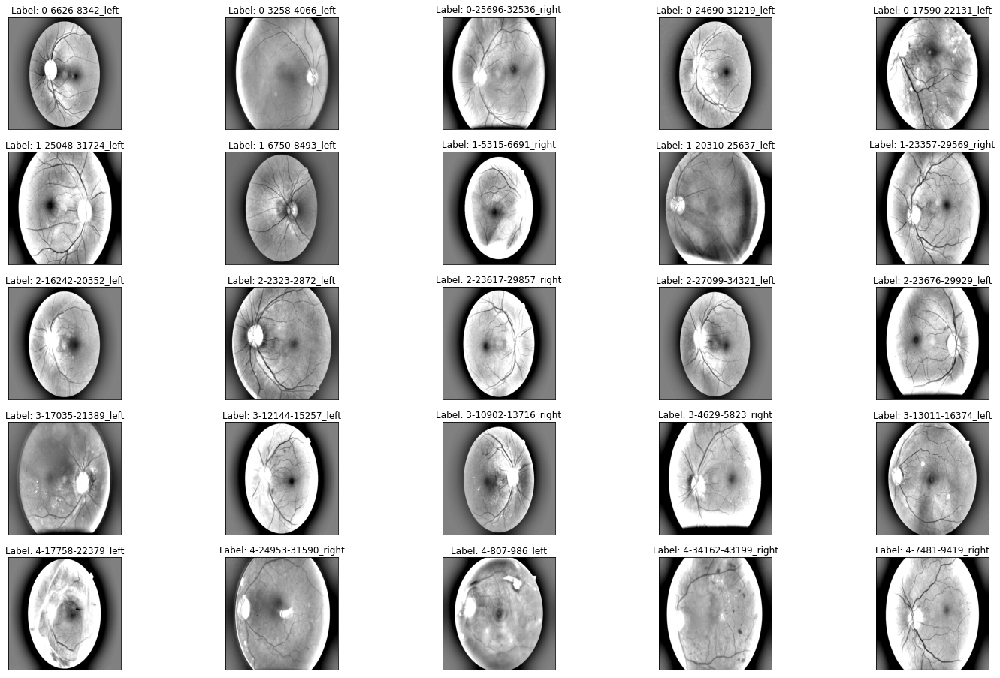

In [0]:
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['level'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/{row['image']}.jpeg"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['image']) )

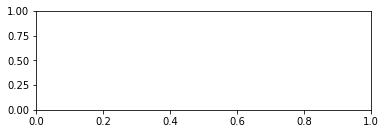

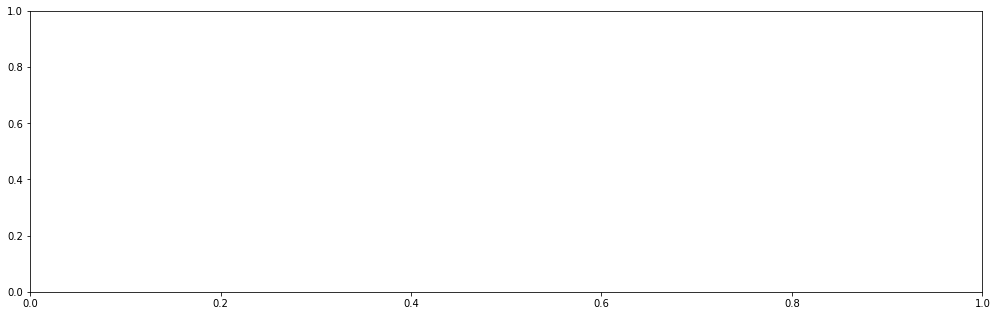

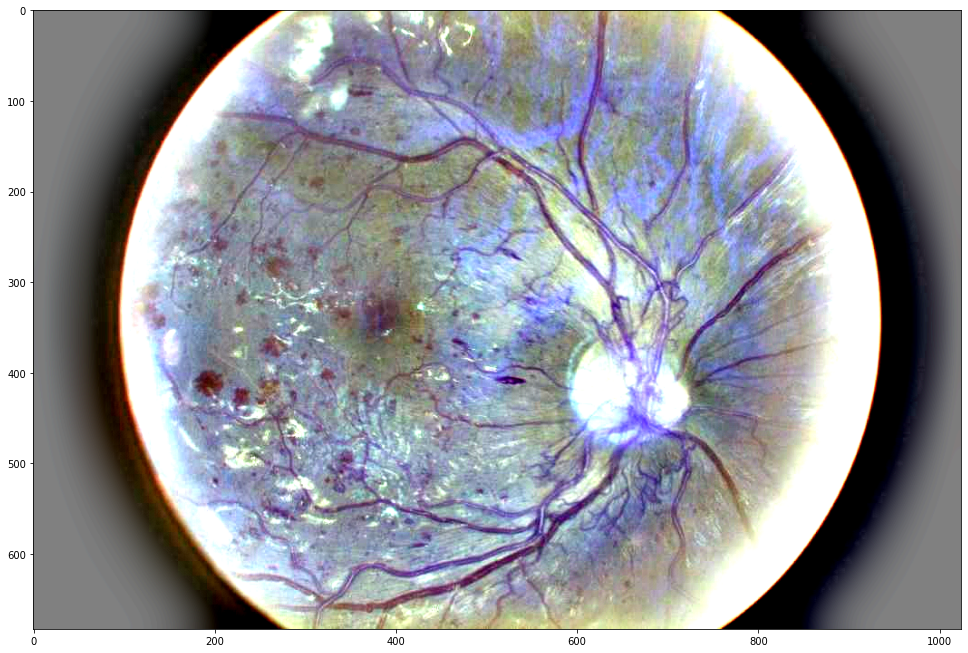

In [0]:
dpi = 10 #inch

path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/16_left.jpeg" # notice upper part
# path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/16_right.jpeg" # lower-right, this still looks not so severe, can be class3
image = cv2.imread(path)

image1 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image2 = cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128)

SCALE=6
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

plt.subplot(2,1,1)
fig = plt.figure(figsize=figsize)
plt.imshow(image1, cmap='gray')

plt.subplot(2,1,2)
fig = plt.figure(figsize=figsize)
plt.imshow(image2, cmap='gray')

Text(0.5, 1.0, 'Gaussian2')

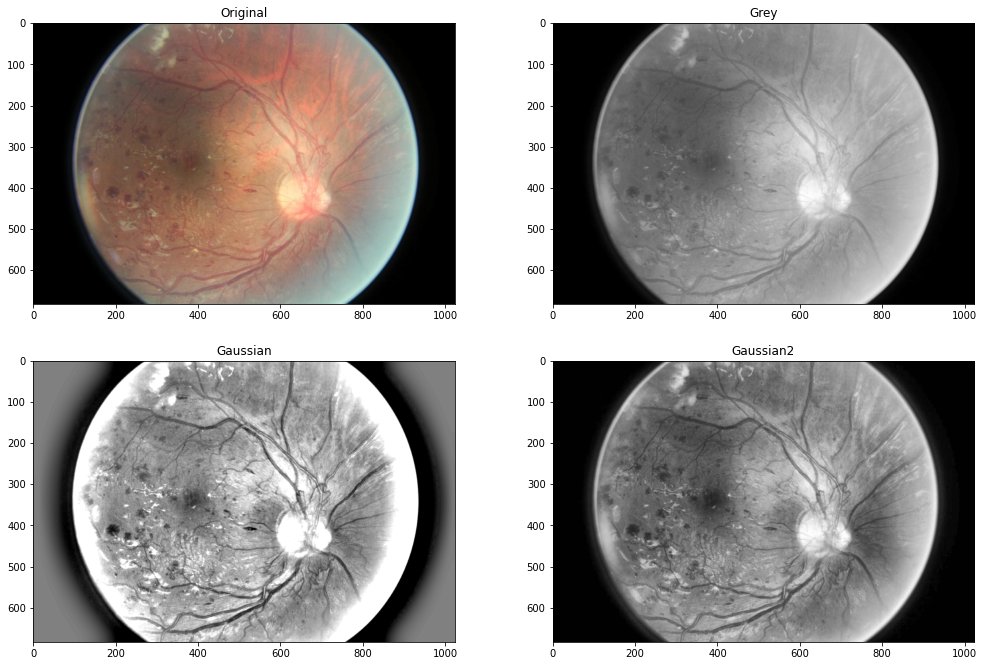

In [0]:
dpi = 10 #inch

path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/16_left.jpeg" # notice upper part
# path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/16_right.jpeg" # lower-right, this still looks not so severe, can be class3
image = cv2.imread(path)

image1 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Original RBG Image
image2 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # Gray image
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # BGR --> GRAY
image3 = cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # Gaussian


clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl1 = clahe.apply(image)

SCALE=6
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE


f = plt.figure(figsize=figsize)
f.add_subplot(2,2, 1)
plt.imshow(image1,cmap = 'gray')
plt.title('Original')

f.add_subplot(2,2, 2)
plt.imshow(image2,cmap = 'gray')
plt.title('Grey')
#plt.show(block=True)

f.add_subplot(2,2, 3)
plt.imshow(image3,cmap = 'gray')
plt.title('Gaussian')

f.add_subplot(2,2, 4)
plt.imshow(cl1,cmap = 'gray')
plt.title('Gaussian2')

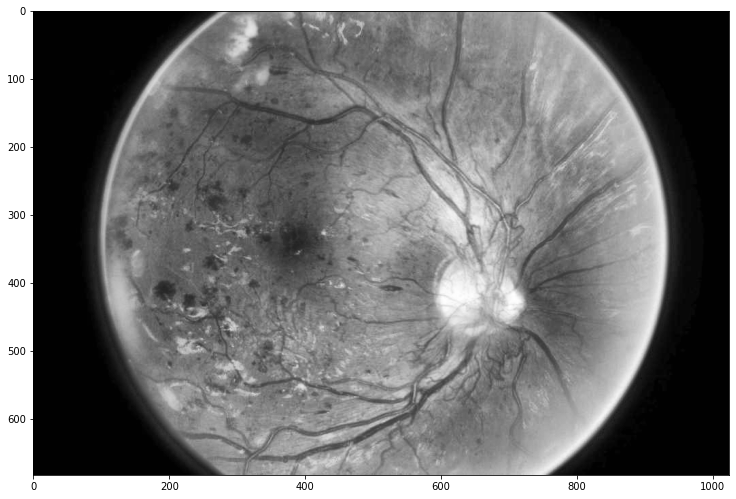

In [0]:
dpi = 20 
path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/16_left.jpeg" # notice upper part
image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#image = cv2.equalizeHist(image)
#image = cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128)

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
image = clahe.apply(image)


SCALE=4
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE
f = plt.figure(figsize=figsize)
plt.imshow(image,cmap = 'gray')
#plt.imshow(cl1,cmap = 'gray')


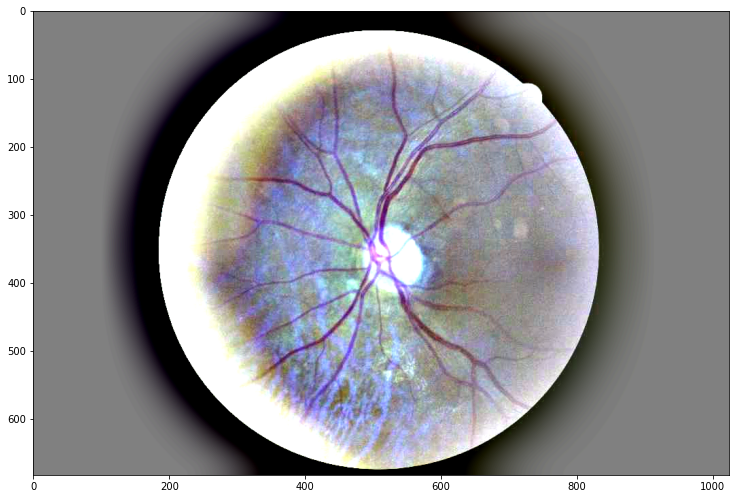

In [0]:
dpi = 20 
path=f"/content/diabetic-retinopathy-customized/resized_train/resized_train/10_left.jpeg" # notice upper part
image = cv2.imread(path)
#image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#image = cv2.equalizeHist(image)
image = cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128)


SCALE=4
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE
f = plt.figure(figsize=figsize)
plt.imshow(image,cmap = 'gray')
#plt.imshow(cl1,cmap = 'gray')


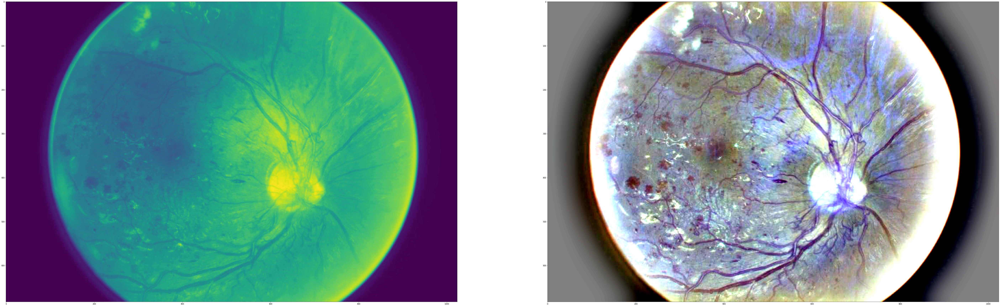

In [0]:
f = plt.figure(figsize=(100,100))
f.add_subplot(1,2, 1)
plt.imshow(image1)
f.add_subplot(1,2, 2)
plt.imshow(image2)
plt.show(block=True)

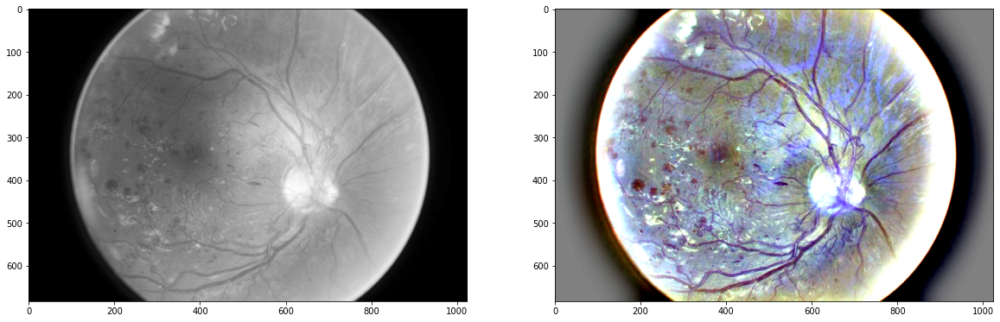

In [0]:
f = plt.figure(figsize=(20,20))

f.add_subplot(1,2, 1)
plt.imshow(image1,cmap = 'gray')
f.add_subplot(1,2, 2)
plt.imshow(image2)
plt.show(block=True)

In [0]:
# Parameters
BATCH_SIZE = 32 
CLASSES = 5 # No. of output classes
EPOCH = 10 

In [0]:
BASE_DIR = '/content/diabetic-retinopathy-customized/resized_train_cropped/resized_train_cropped'

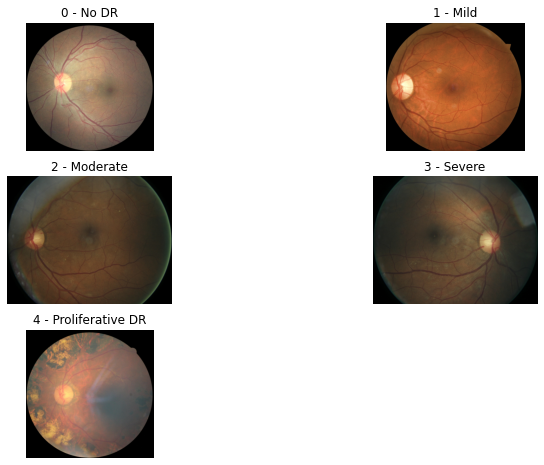

In [0]:
import cv2
import matplotlib.pyplot as plt

def Plot(image_path):
    image = cv2.imread(image_path)  # BGR
    image = image[:, :, [2, 1, 0]]  # RGB
    plt.imshow(image)
    return

plt.figure(figsize=(12,8))
plt.subplot(321)
plt.title('0 - No DR'); 
plt.axis('off'); 
Plot(os.path.join(BASE_DIR, 'level_0/10003_left.jpeg'))

plt.subplot(322)
plt.title('1 - Mild'); 
plt.axis('off'); 
Plot(os.path.join(BASE_DIR, 'level_1/10030_left.jpeg'))

plt.subplot(323)
plt.title('2 - Moderate'); 
plt.axis('off'); 
Plot(os.path.join(BASE_DIR, 'level_2/1002_right.jpeg'))

plt.subplot(324)
plt.title('3 - Severe'); 
plt.axis('off'); 
Plot(os.path.join(BASE_DIR, 'level_3/1002_left.jpeg'))


plt.subplot(325)
plt.title('4 - Proliferative DR'); 
plt.axis('off'); 
Plot(os.path.join(BASE_DIR, 'level_4/10017_left.jpeg'))

In [0]:
print('Training samples:\n')
TRAIN_DIR = BASE_DIR
num_samples = 0

for n in os.listdir(TRAIN_DIR): 
    
    
    num = len(os.listdir(os.path.join(TRAIN_DIR, n)))
    num_samples = num_samples + num
    print('STAGE: {:15s} Number of samples: {}'.format(n, num))
    print("..............................................")
    
print('Total training samples: {:d}\n'.format(num_samples))

Training samples:

STAGE: level_0         Number of samples: 25802
..............................................
STAGE: level_1         Number of samples: 2438
..............................................
STAGE: level_3         Number of samples: 872
..............................................
STAGE: level_2         Number of samples: 5288
..............................................
STAGE: level_4         Number of samples: 708
..............................................
Total training samples: 35108



In [0]:
IMG_SIZE = 256
BATCH_SIZE = 32
EPOCHS = 50
NUM_CLASSES = 5
CATEGORIES = ['0','1','2','3','4']

In [0]:
# importing the libraries
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from keras.preprocessing import image
%matplotlib inline 

In [0]:
#df_train1 (csv).....train labels

In [0]:
TRAIN_PATH = '/content/diabetic-retinopathy-customized/resized_train/resized_train/'

In [0]:
from PIL import Image
from imageio import imread
from skimage.transform import resize
import cv2
from tqdm import tqdm

In [0]:
# defining a function to read images
def read_img(img_path):
    img = image.load_img(img_path, target_size=(224, 224, 3))
    img = image.img_to_array(img)

    return img

# reading the images
train_img = []
for img_path in tqdm(df_train1.image.values):
  train_img.append(read_img(TRAIN_PATH + img_path + '.jpeg'))

    

In [0]:
train_img = np.array(train_img,np.float32)

In [0]:
len(train_img)

NameError: ignored

In [0]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()
lb.fit(train.Animal.values)
y = lb.transform(train.Animal.values)